<a href="https://colab.research.google.com/github/Pawanme9034/k_means_clustering/blob/main/Credit_Card_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import PowerTransformer
pt=PowerTransformer()
demo = pd.read_csv("credit_card_data.csv")
demo = demo.drop('CUST_ID',axis=1)
demo.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [ ]:
demo.skew()

BALANCE                              2.393386
BALANCE_FREQUENCY                   -2.023266
PURCHASES                            8.144269
ONEOFF_PURCHASES                    10.045083
INSTALLMENTS_PURCHASES               7.299120
CASH_ADVANCE                         5.166609
PURCHASES_FREQUENCY                  0.060164
ONEOFF_PURCHASES_FREQUENCY           1.535613
PURCHASES_INSTALLMENTS_FREQUENCY     0.509201
CASH_ADVANCE_FREQUENCY               1.828686
CASH_ADVANCE_TRX                     5.721298
PURCHASES_TRX                        4.630655
CREDIT_LIMIT                         1.522464
PAYMENTS                             5.907620
MINIMUM_PAYMENTS                    13.622797
PRC_FULL_PAYMENT                     1.942820
TENURE                              -2.943017
dtype: float64

In [ ]:
!pip install sweetviz
import sweetviz as sv
sweet_report = sv.analyze(demo)
sweet_report.show_html('sweet_report.html')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 77.1 MB/s eta 0:00:00


                                             |          | [  0%]   00:00 -> (? left)

Report sweet_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


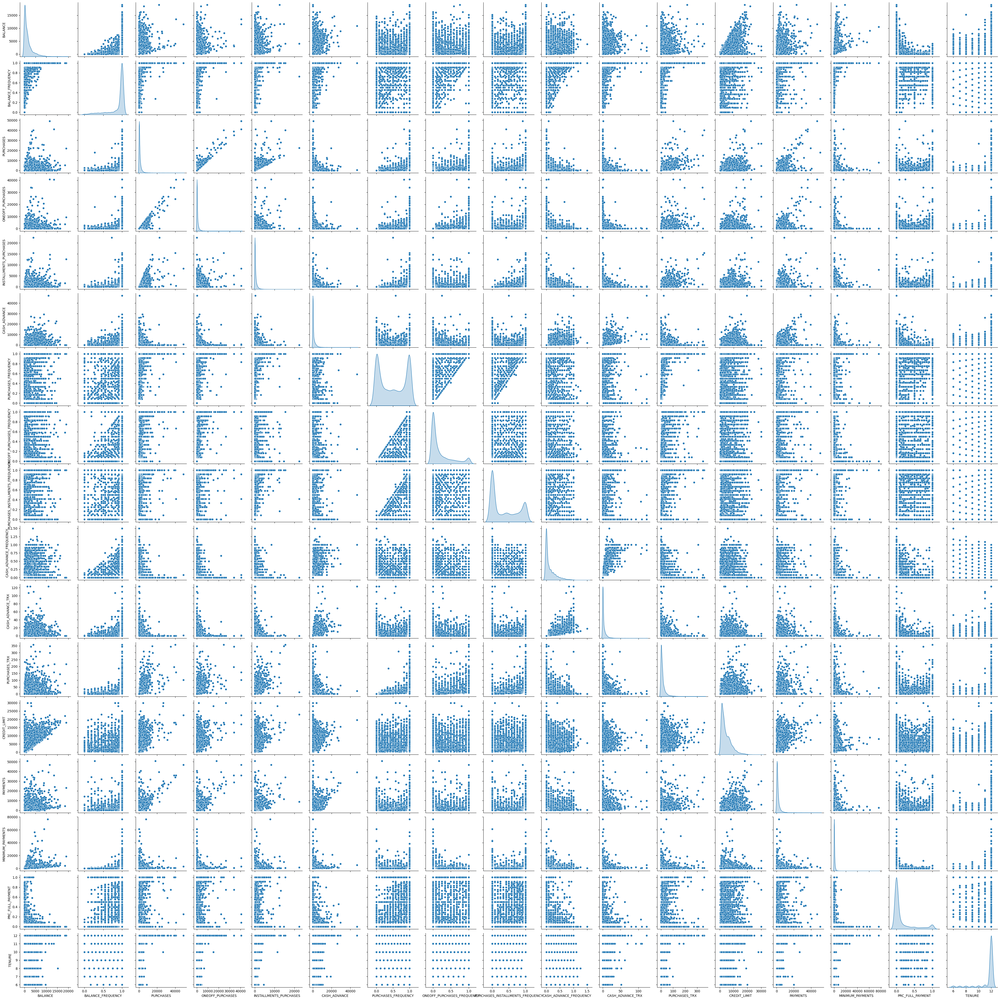

In [ ]:
sns.pairplot(demo,diag_kind='kde')

<Axes: >

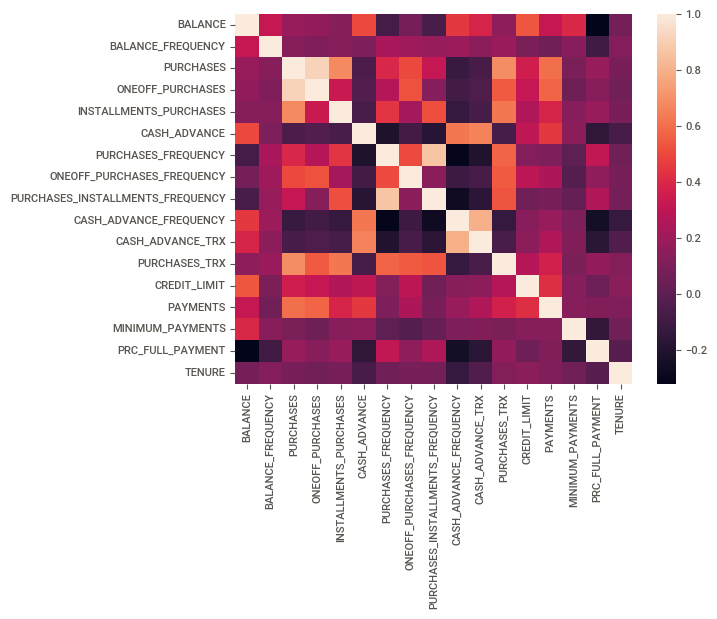

In [ ]:
sns.heatmap(demo.corr())

In [ ]:
powerdemo = pd.DataFrame(pt.fit_transform(demo))
powerdemo.columns= demo.columns
powerdemo.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-1.238103,-1.079348,-0.368050,-1.000488,0.383704,-0.944538,-0.766859,-0.903315,-0.606642,-0.883204,-0.905801,-0.573664,-1.425281,-0.983876,-0.814650,-0.677889,0.422252
1,1.051961,-0.424939,-1.505149,-1.000488,-1.085422,1.399909,-1.278866,-0.903315,-1.004445,1.124423,1.044342,-1.387624,0.924151,1.285321,0.896942,1.235021,0.422252
2,0.860616,0.628612,0.521657,1.065381,-1.085422,-0.944538,1.218860,1.732554,-1.004445,-0.883204,-0.905801,0.494757,1.012124,-0.291722,0.462221,-0.677889,0.422252
3,0.570542,-1.710851,0.875823,1.229556,-1.085422,0.680451,-1.015926,-0.092230,-1.004445,0.136071,0.194580,-0.872718,1.012124,-2.782085,NaN,-0.677889,0.422252
4,0.111925,0.628612,-0.904786,-0.019902,-1.085422,-0.944538,-1.015926,-0.092230,-1.004445,-0.883204,-0.905801,-0.872718,-1.215649,-0.231669,-0.327121,-0.677889,0.422252


In [ ]:
powerdemo.skew()

BALANCE                            -0.119428
BALANCE_FREQUENCY                  -1.118938
PURCHASES                          -0.178677
ONEOFF_PURCHASES                    0.115147
INSTALLMENTS_PURCHASES             -0.014843
CASH_ADVANCE                        0.188413
PURCHASES_FREQUENCY                -0.044848
ONEOFF_PURCHASES_FREQUENCY          0.541358
PURCHASES_INSTALLMENTS_FREQUENCY    0.217056
CASH_ADVANCE_FREQUENCY              0.506434
CASH_ADVANCE_TRX                    0.392581
PURCHASES_TRX                       0.006058
CREDIT_LIMIT                       -0.009659
PAYMENTS                            0.124631
MINIMUM_PAYMENTS                   -0.025604
PRC_FULL_PAYMENT                    0.963939
TENURE                             -1.971472
dtype: float64

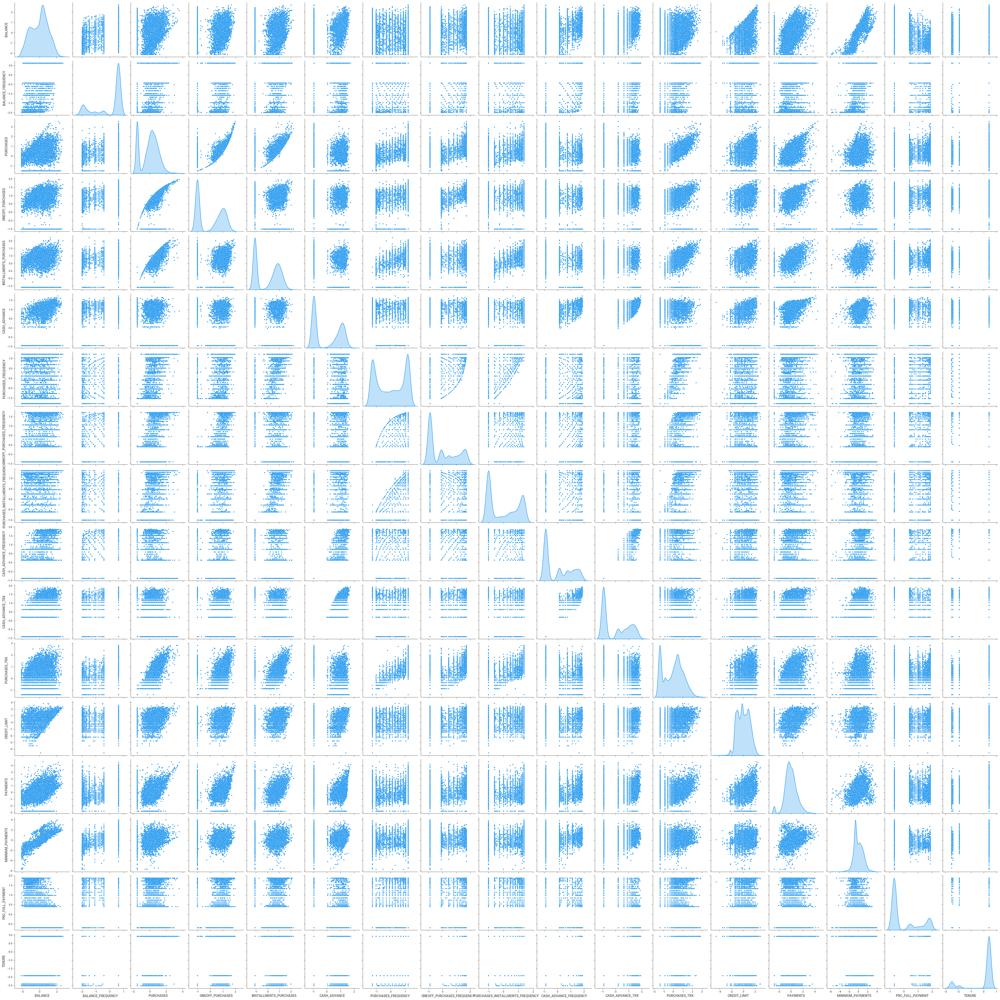

In [ ]:
sns.pairplot(powerdemo,diag_kind='kde')

In [ ]:
X = powerdemo

In [ ]:
X = X.dropna()

In [ ]:
from sklearn.cluster import KMeans
# Let us check optimal number of clusters-
cluster_range = range( 1, 10)   # expect 3 to four clusters from the pair panel visual inspection hence restricting from 2 to 6
cluster_errors = []
cluster_sil_scores = []
for num_clusters in cluster_range:
  clusters = KMeans( num_clusters, n_init = 5,max_iter=100)
  clusters.fit(X)
  labels = clusters.labels_                     # capture the cluster lables
  centroids = clusters.cluster_centers_         # capture the centroids
  cluster_errors.append( clusters.inertia_ )    # capture the intertia
# combine the cluster_range and cluster_errors into a dataframe by combining them
clusters_df = pd.DataFrame( { "num_clusters":cluster_range, "cluster_errors": cluster_errors} )
clusters_df[0:10]

,num_clusters,cluster_errors
0,1,144535.489521
1,2,103771.913791
2,3,86297.485346
3,4,76265.045291
4,5,68103.122677
5,6,64346.203663
6,7,60499.008037
7,8,57512.374072
8,9,54850.033326


In [ ]:
errors = clusters_df['cluster_errors']

In [ ]:
for i in range(8):
    print(errors[i+1]-errors[i])

-40763.575729299046
-17474.428444877645
-10032.440054891398
-8161.922614367533
-3756.919014373416
-3847.1956252499876
-2986.6339654140247
-2662.3407457895228


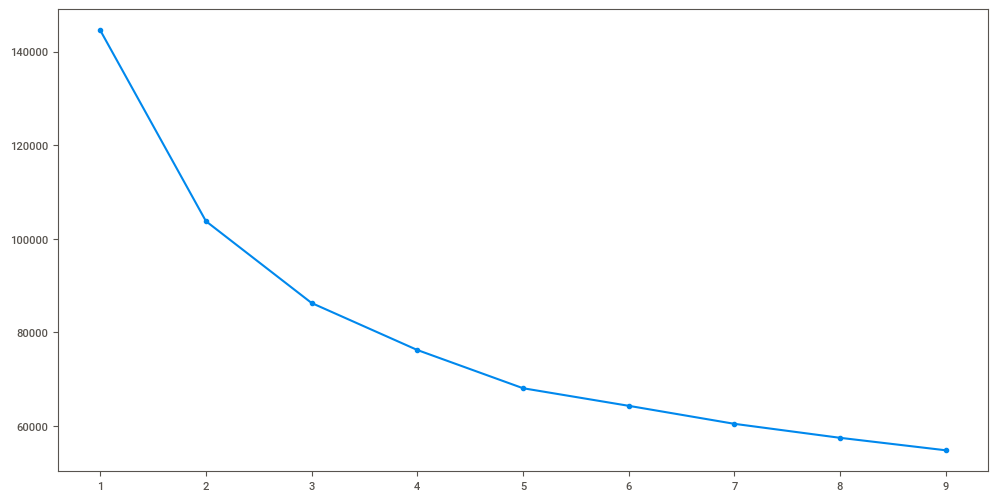

In [ ]:
# Elbow plot

plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )

In [ ]:
# Number of clusters
kmeans = KMeans(n_clusters=5)
# Fitting the input data
kmeans = kmeans.fit(X)
# Getting the cluster labels
labels = kmeans.predict(X)
# Centroid values
centroids = kmeans.cluster_centers_
# Comparing with scikit-learn centroids
print("Centroid values")
print("sklearn")
print(centroids) # From sci-kit learn

Centroid values
sklearn
[[-0.4349302  -0.42900057  0.19406288  0.79193305 -0.79860721 -0.77653558
  -0.3580234   0.62501417 -0.85743391 -0.7578163  -0.77071619 -0.16450159
  -0.14988746 -0.2759955  -0.45360309 -0.15968977  0.0174046 ]
 [ 0.81531075  0.43469849  0.63737837  0.57692496  0.49012221  1.07454417
   0.57177957  0.5676389   0.43952378  1.05570651  1.08563621  0.6648597
   0.33886021  0.54970791  0.72464422 -0.35062446  0.01702658]
 [-0.89298207 -0.31918893  0.16926103 -0.83814139  0.79082262 -0.88653964
   0.61021137 -0.79642704  0.87056496 -0.83884026 -0.85937075  0.34138025
  -0.44950045 -0.44867235 -0.61838204  0.67192228 -0.0118469 ]
 [ 0.48435771  0.10808524 -1.28555144 -0.77450958 -1.03052752  1.00910076
  -1.20404564 -0.75852002 -0.97590352  0.96232463  0.974126   -1.25378282
  -0.11939662  0.04027201  0.27437228 -0.37499658 -0.1557037 ]
 [ 0.13092541  0.43187992  1.12139057  1.08786103  0.9451177  -0.87436652
   0.99549125  1.17793004  0.85816346 -0.83547092 -0.853470

In [ ]:
prediction= kmeans.predict(X)
X_df = X
X_df["group"] = prediction

In [ ]:
X_df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,group
0,-1.238103,-1.079348,-0.368050,-1.000488,0.383704,-0.944538,-0.766859,-0.903315,-0.606642,-0.883204,-0.905801,-0.573664,-1.425281,-0.983876,-0.814650,-0.677889,0.422252,2
1,1.051961,-0.424939,-1.505149,-1.000488,-1.085422,1.399909,-1.278866,-0.903315,-1.004445,1.124423,1.044342,-1.387624,0.924151,1.285321,0.896942,1.235021,0.422252,3
2,0.860616,0.628612,0.521657,1.065381,-1.085422,-0.944538,1.218860,1.732554,-1.004445,-0.883204,-0.905801,0.494757,1.012124,-0.291722,0.462221,-0.677889,0.422252,0
4,0.111925,0.628612,-0.904786,-0.019902,-1.085422,-0.944538,-1.015926,-0.092230,-1.004445,-0.883204,-0.905801,-0.872718,-1.215649,-0.231669,-0.327121,-0.677889,0.422252,0
5,0.627913,0.628612,0.810232,-1.000488,1.254377,-0.944538,0.511403,-0.903315,0.801521,-0.883204,-0.905801,0.228734,-0.741828,0.314083,1.532118,-0.677889,0.422252,2


array([[<Axes: title={'center': 'BALANCE'}, xlabel='[group]'>,
        <Axes: title={'center': 'BALANCE_FREQUENCY'}, xlabel='[group]'>,
        <Axes: title={'center': 'CASH_ADVANCE'}, xlabel='[group]'>,
        <Axes: title={'center': 'CASH_ADVANCE_FREQUENCY'}, xlabel='[group]'>,
        <Axes: title={'center': 'CASH_ADVANCE_TRX'}, xlabel='[group]'>,
        <Axes: title={'center': 'CREDIT_LIMIT'}, xlabel='[group]'>],
       [<Axes: title={'center': 'INSTALLMENTS_PURCHASES'}, xlabel='[group]'>,
        <Axes: title={'center': 'MINIMUM_PAYMENTS'}, xlabel='[group]'>,
        <Axes: title={'center': 'ONEOFF_PURCHASES'}, xlabel='[group]'>,
        <Axes: title={'center': 'ONEOFF_PURCHASES_FREQUENCY'}, xlabel='[group]'>,
        <Axes: title={'center': 'PAYMENTS'}, xlabel='[group]'>,
        <Axes: title={'center': 'PRC_FULL_PAYMENT'}, xlabel='[group]'>],
       [<Axes: title={'center': 'PURCHASES'}, xlabel='[group]'>,
        <Axes: title={'center': 'PURCHASES_FREQUENCY'}, xlabel='[group]

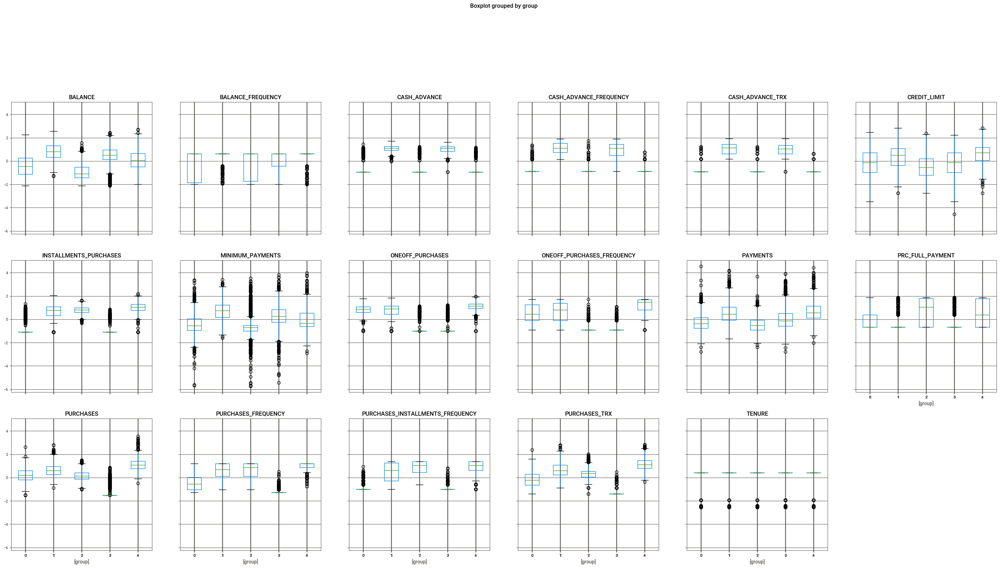

In [ ]:
X_df.boxplot(by = 'group',  layout=(6,6), figsize=(35, 35))

Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.26824461800708577


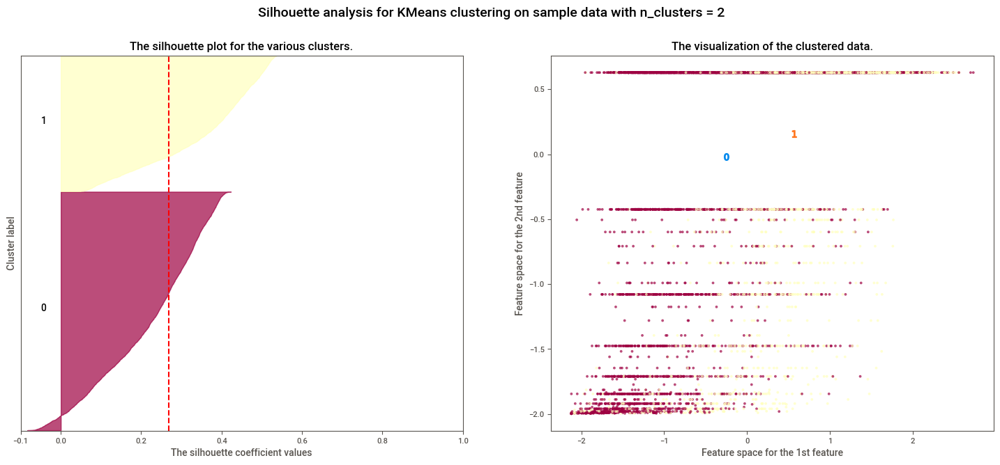

For n_clusters = 3 The average silhouette_score is : 0.24056472438088783


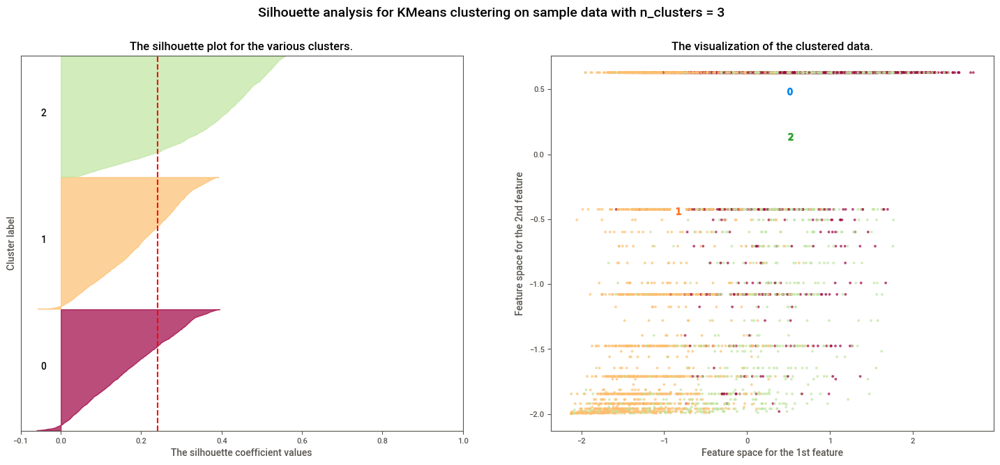

For n_clusters = 4 The average silhouette_score is : 0.2359312919312127


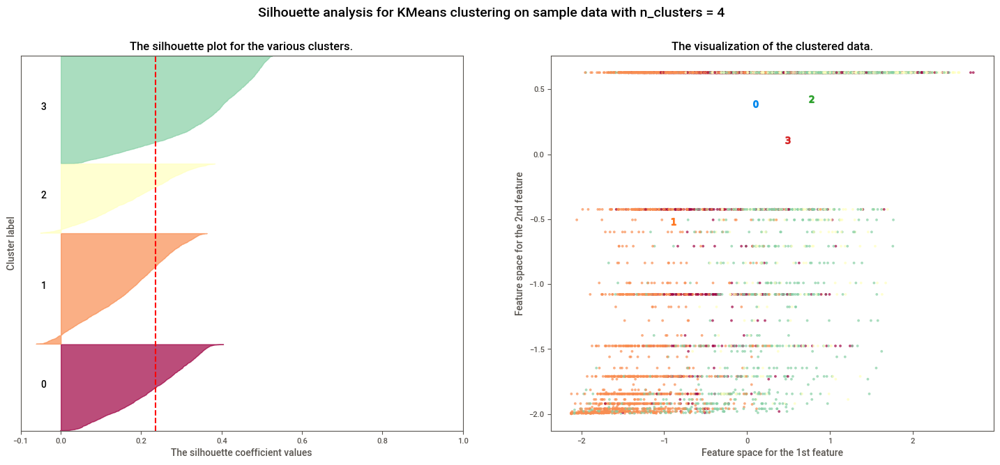

For n_clusters = 5 The average silhouette_score is : 0.24925566943275781


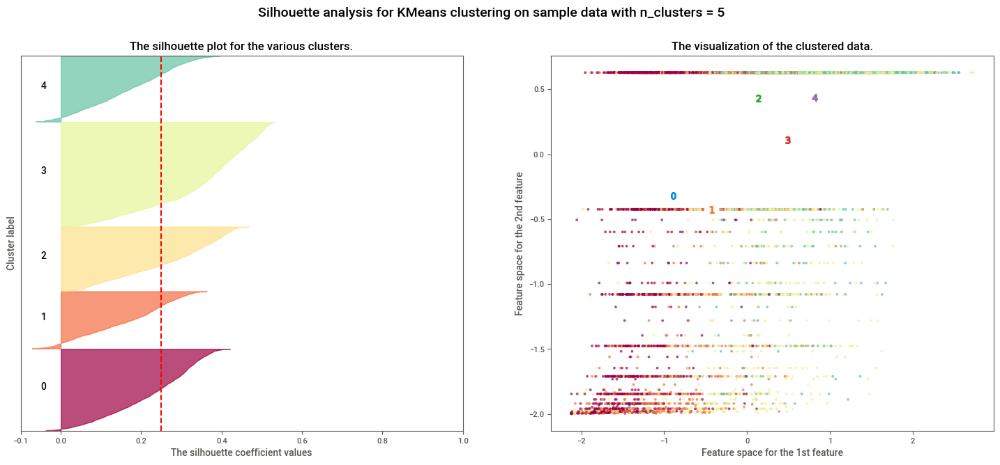

For n_clusters = 6 The average silhouette_score is : 0.23815552301431073


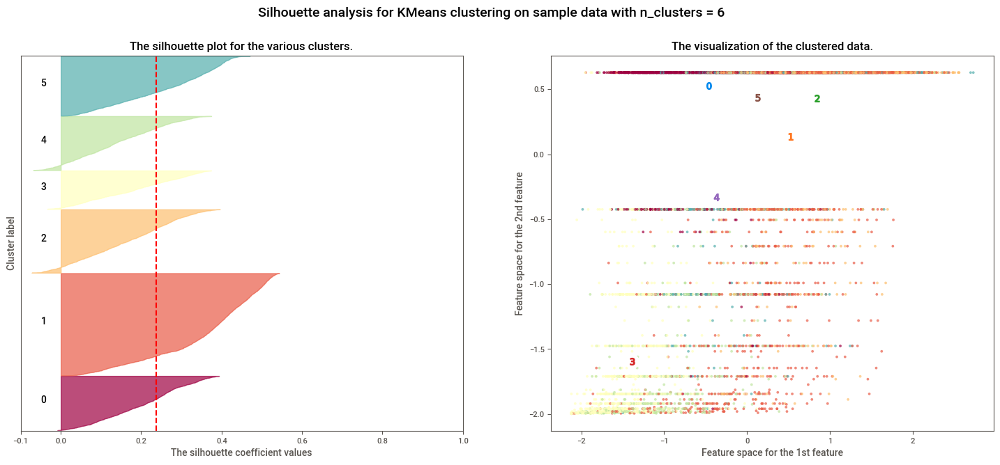

For n_clusters = 7 The average silhouette_score is : 0.2240276056019438


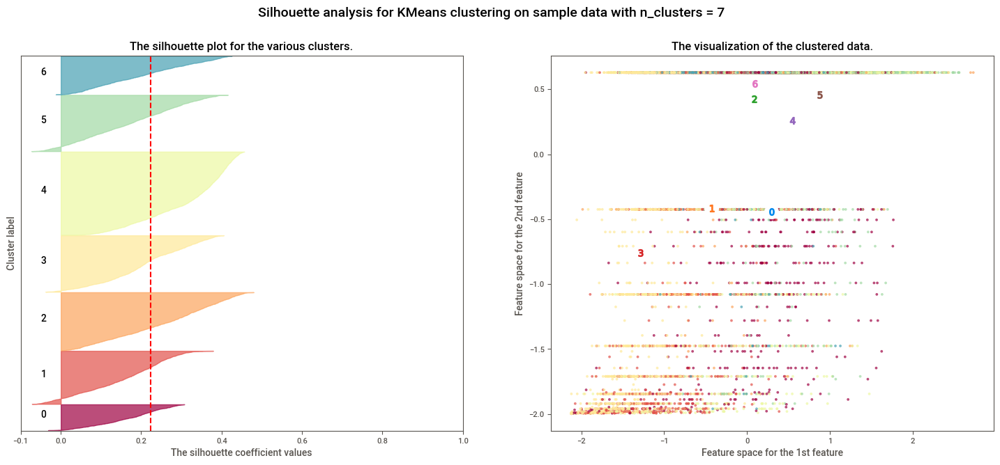

For n_clusters = 8 The average silhouette_score is : 0.2210227649910527


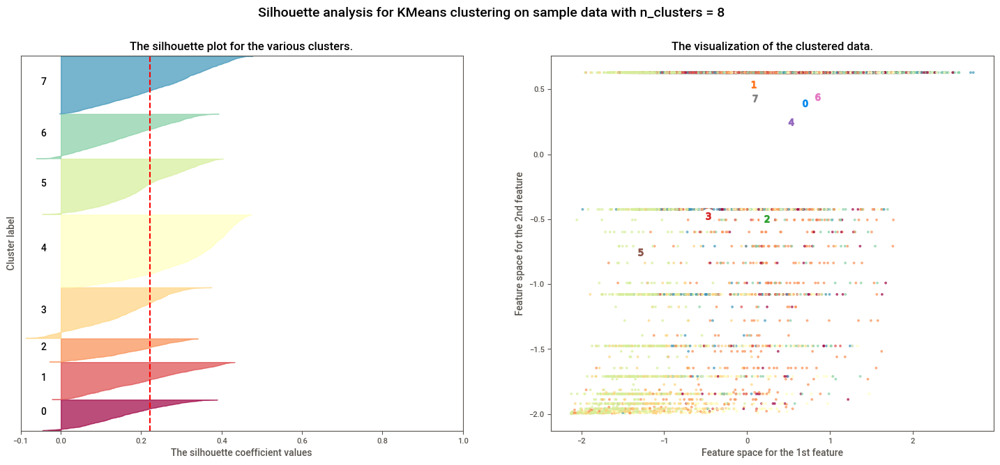

For n_clusters = 9 The average silhouette_score is : 0.20901407129984026


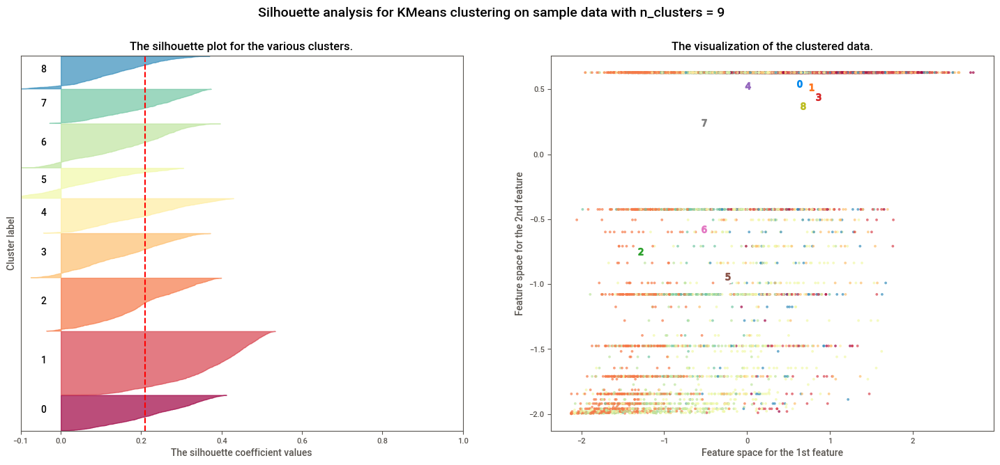

For n_clusters = 10 The average silhouette_score is : 0.1922919212890915


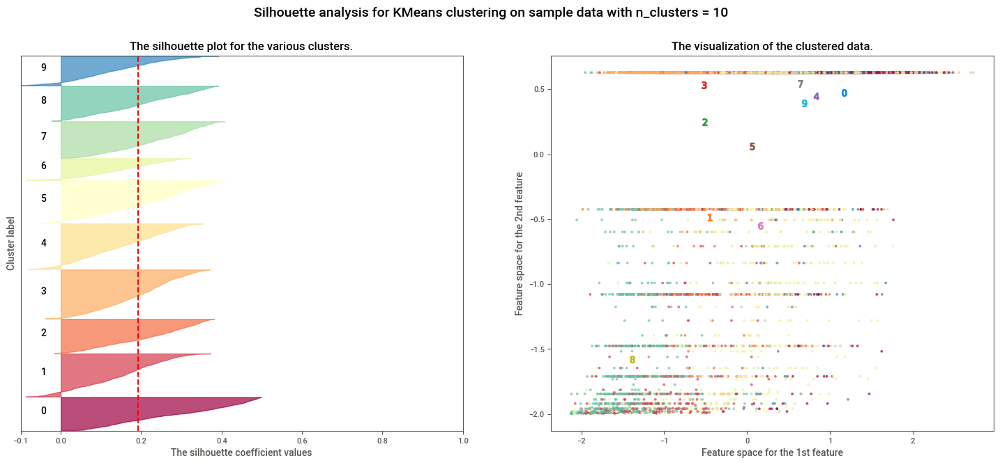

In [ ]:
from __future__ import print_function
%matplotlib inline

from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
X=X_df.drop('group',axis=1).values
y=X_df['group'].values

range_n_clusters = [2, 3, 4, 5, 6,7,8,9,10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.Spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.Spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
model2 = AgglomerativeClustering(n_clusters=5, affinity='euclidean',  linkage='ward')

In [ ]:
model2.fit(X)

AgglomerativeClustering(affinity='euclidean', n_clusters=5)

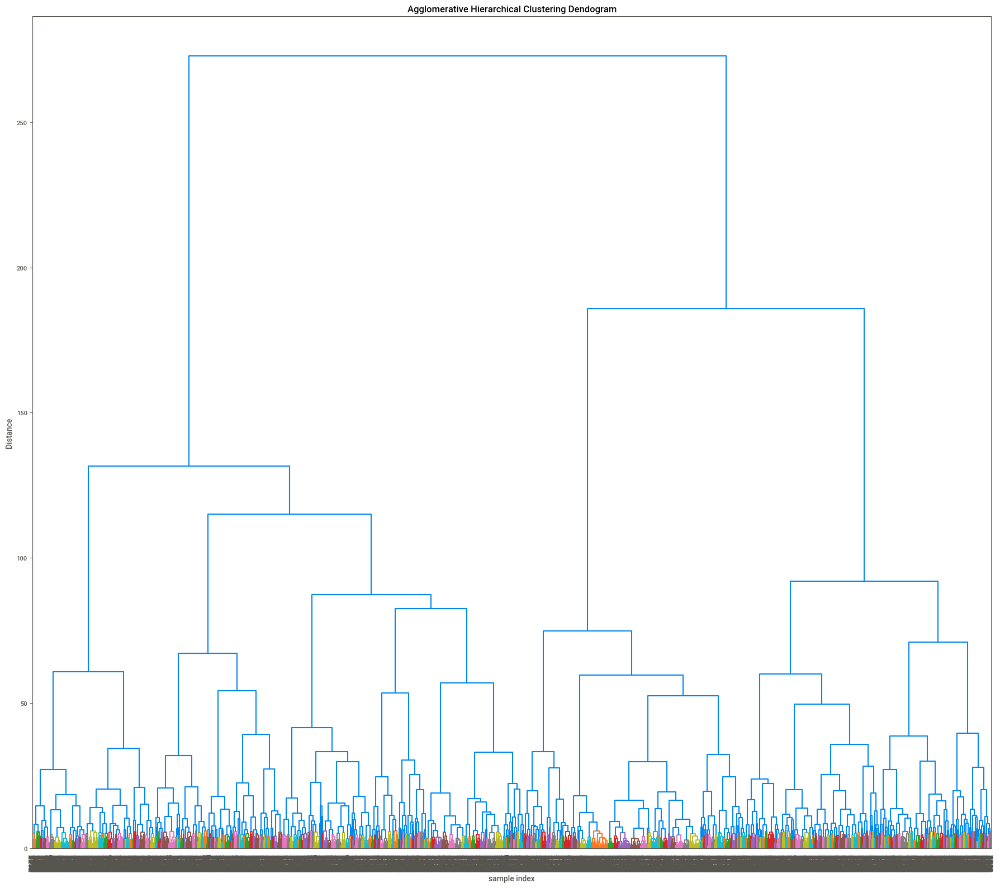

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
plt.figure(figsize=(18, 16))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
Z = linkage(X, 'ward')
dendrogram(Z,leaf_rotation=90.0,p=25,color_threshold=6,leaf_font_size=10,truncate_mode='level')
plt.tight_layout()